<h1>Midterm task</h1>

You are given the data of customer satisfaction of the flight. This information could help to improve the customer satisfaction. Your main goal is to create a classifier and iterpret it, helping company to distinguish the features or patterns that could help to improve the customer satisfaction.

Your goal is to apply your knowledge in EDA, data preprocessing and model training. Also, you should provide complete explanation of your steps meaningful from the machine learning point of view. For example, *why do you use that particular plot?* *Why do you suppose that this model will work well with your data?*

---

To evaluate training results, use `StratifiedKFold` with 10 splits and `random_state = 42` and `balanced_accuracy_score`.  
Compute the average value over all the splits for test data.

---

**Grading schema:**
* EDA (25%) - *single feature plots*, *multiple feature plots*...
* Data Preprocessing (25%) - *feature engineering*, *feature selection*, *dimensionality reduction*...
* Model prediction quality (25%) - described above
* Comment/explanation quality (25%) - *just describe your ML-steps*

---

**Predict:** `satisfaction`  


In [ ]:
!gdown 13nO86N0aLnT5dN54rhPfI1srbSGamdDO -O airline_data.csv

Downloading...
From: https://drive.google.com/uc?id=13nO86N0aLnT5dN54rhPfI1srbSGamdDO
To: /content/airline_data.csv
100% 12.0M/12.0M [00:00<00:00, 55.0MB/s]


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from pandas.plotting import parallel_coordinates
from sklearn.decomposition import NMF
from sklearn.cross_decomposition import CCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## EDA

Analyze the data using various plots considered during the course. Use various plots, preferrably all of them. (25% – EDA)

Explain, what information are you going to explore by each of the plots you use, what conclusions do you draw from the dependenices you see? (5% – Explain)

In [ ]:
# Загрузка данных
airline_df = pd.read_csv('/content/airline_data.csv', low_memory=False)

### Гистограммы и ящики (box plots):
Позволяют оценить распределение численных переменных, таких как возраст, стоимость билета, время полета и другие. Мы можем определить выбросы, медиану, среднее значение и диапазон значений.

In [ ]:
airline_df.head(5)

,satisfaction,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,2,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,3,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,3,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,3,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,3,...,4,2,2,0,2,4,2,5,0,0.0


In [ ]:
# Выберем только численные признаки для анализа
numeric_features = [
    'Age', 'Flight Distance', 'Seat comfort', 'Departure/Arrival time convenient',
    'Food and drink', 'Inflight wifi service', 'Inflight entertainment',
    'Online support', 'Ease of Online booking', 'On-board service',
    'Leg room service', 'Baggage handling', 'Checkin service', 'Cleanliness',
    'Online boarding', 'Departure Delay in Minutes', 'Arrival Delay in Minutes'
]

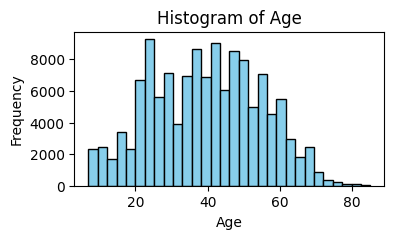

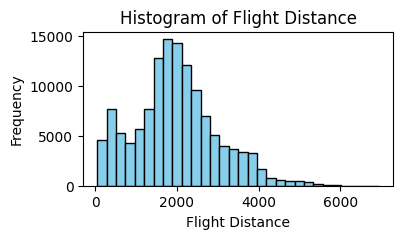

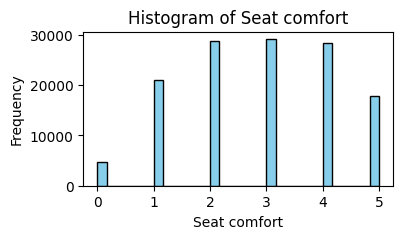

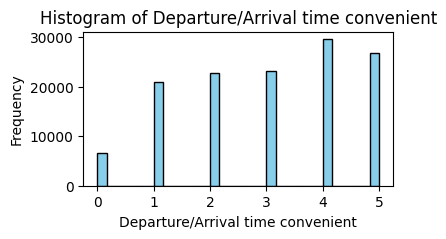

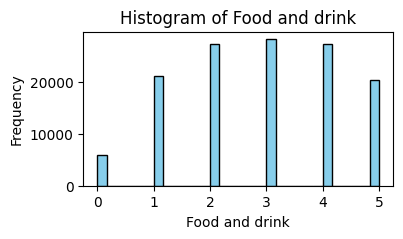

...

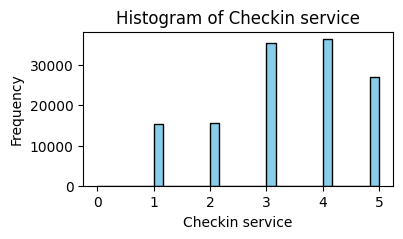

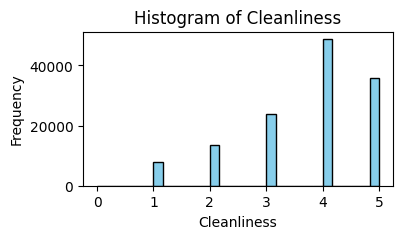

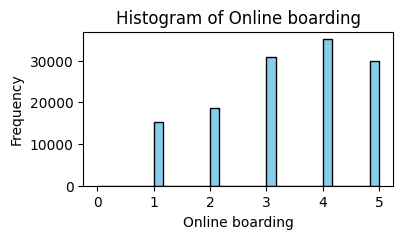

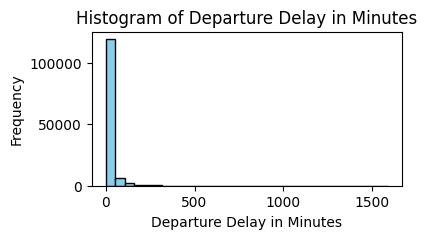

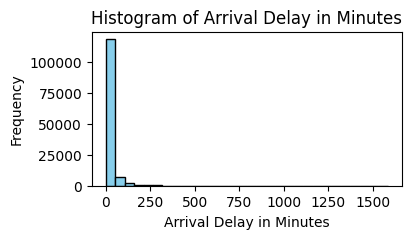

In [ ]:
# Создадим гистограммы для каждого численного признака
for feature in numeric_features:
    plt.figure(figsize=(4, 2))
    plt.hist(airline_df[feature], bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

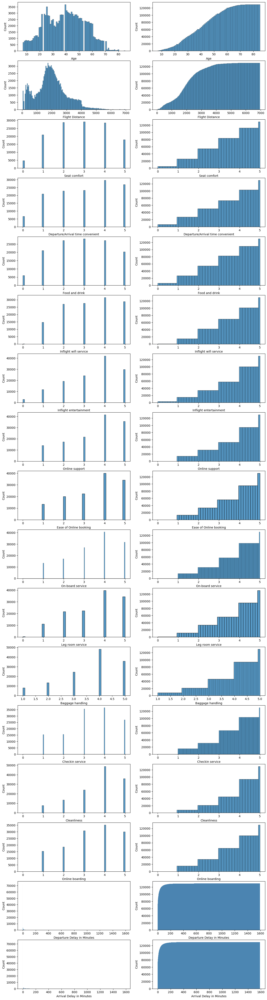

In [ ]:
# Создадим гистограммы для каждого численного признака c cumulative
fig, axs = plt.subplots(len(numeric_features), 2, figsize=(15, 60))

for i, column in enumerate(numeric_features):
    sns.histplot(airline_df[column], ax=axs[i, 0])
    sns.histplot(airline_df[column], ax=axs[i, 1], cumulative=True)
plt.show()

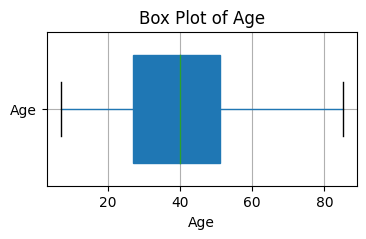

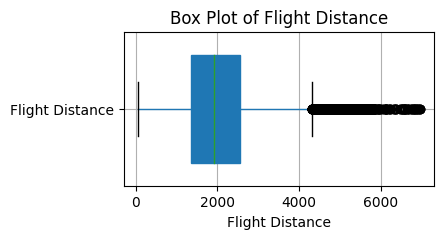

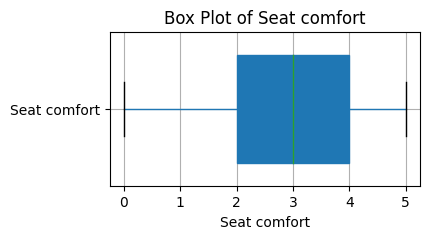

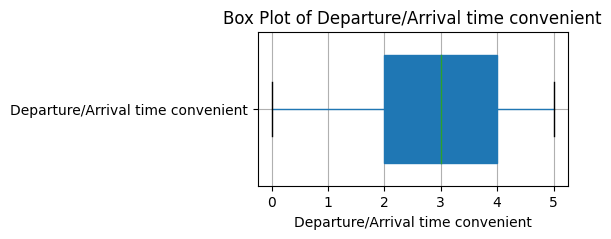

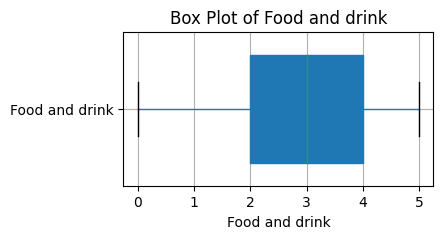

...

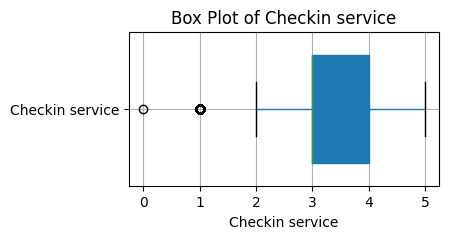

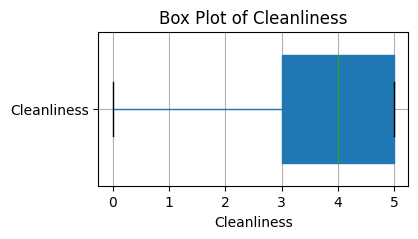

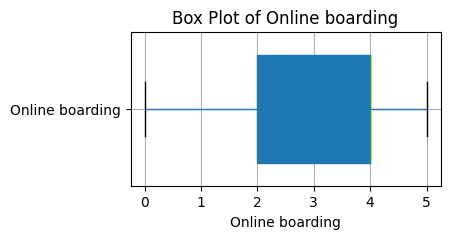

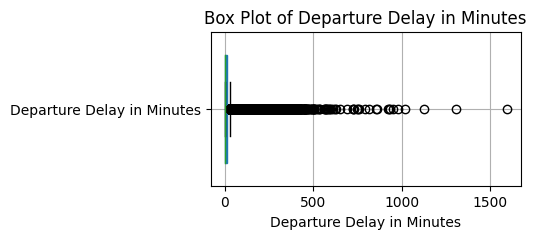

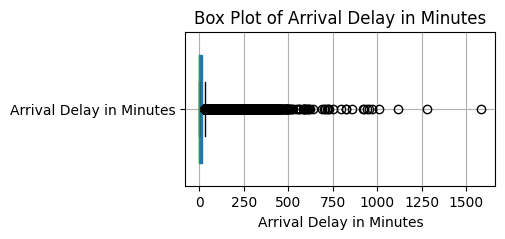

In [ ]:
# Создадим ящики (box plots) для каждого численного признака
for feature in numeric_features:
    plt.figure(figsize=(4, 2))
    airline_df.boxplot(column=feature, vert=False, widths=0.7, patch_artist=True)
    plt.title(f'Box Plot of {feature}')
    plt.xlabel(feature)
    plt.show()

### Графики и ящики


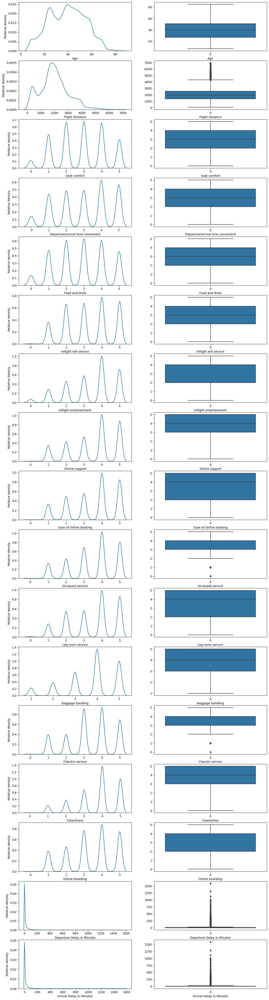

In [ ]:
# Создайте графики и ящики для численных значений
fig, axs = plt.subplots(len(numeric_features), 2, figsize=(15, 60))

for i, column in enumerate(numeric_features):
    sns.kdeplot(airline_df[column], ax=axs[i, 0])
    sns.boxplot(airline_df[column], ax=axs[i, 1])
    axs[i, 0].set_xlabel(column)
    axs[i, 0].set_ylabel("Relative density")
    axs[i, 1].set_xlabel(column)

plt.show()

### Графики скрипок
Графики скрипок показывают:

1. Распределение числового признака в двух категориях "satisfied" и "dissatisfied" (или других соответствующих значениях признака "satisfaction").
2. Они демонстрируют плотность распределения признака, что позволяет видеть, какие значения признака более популярны в каждой из категорий.

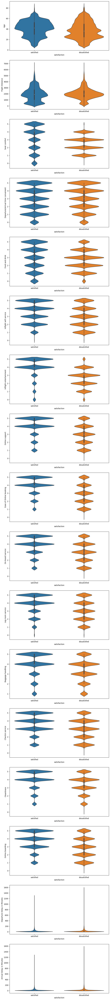

In [ ]:
# Графики скрипок для численных признаков
fig, axs = plt.subplots(len(numeric_features), 1, figsize=(10, 100))

for i, column in enumerate(numeric_features):
    sns.violinplot(data=airline_df, x="satisfaction", y=column, ax=axs[i])
plt.show()

### Диаграммы рассеяния (scatter plots):
Позволяют исследовать взаимосвязи между численными переменными. Мы можем проверить, существуют ли какие-либо корреляции между параметрами.

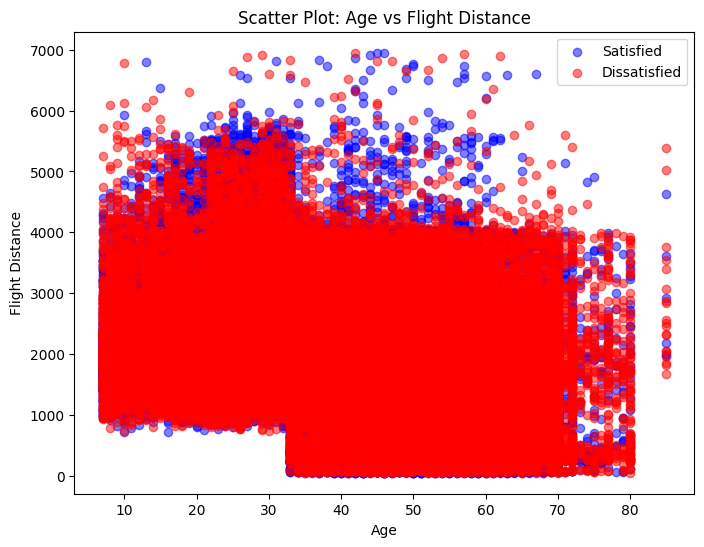

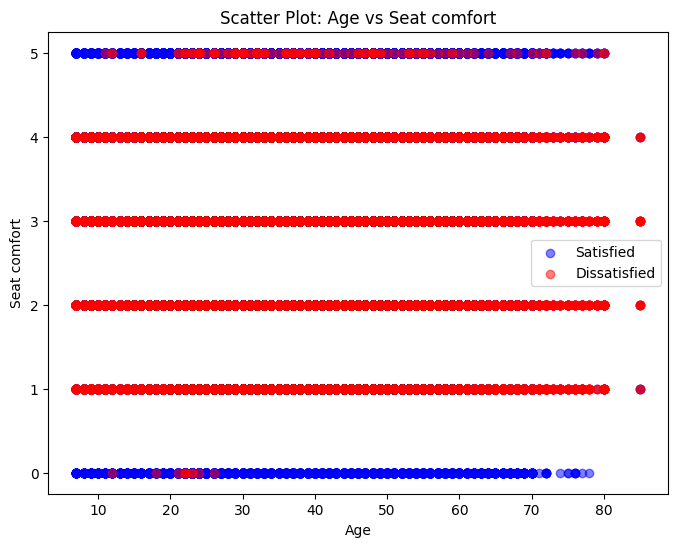

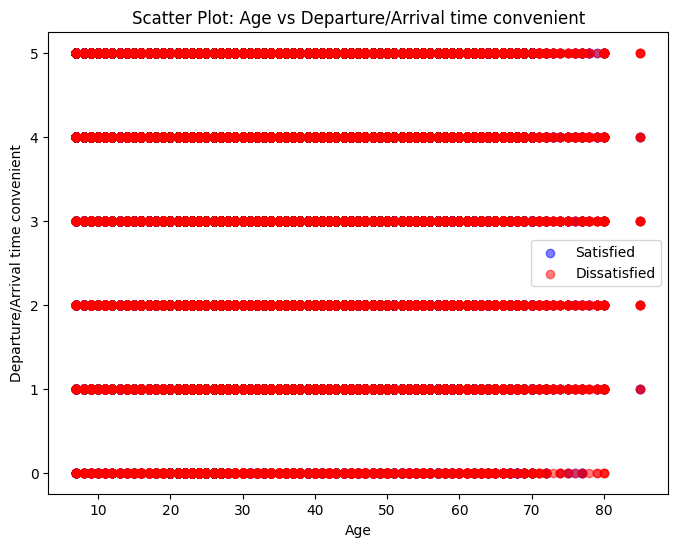

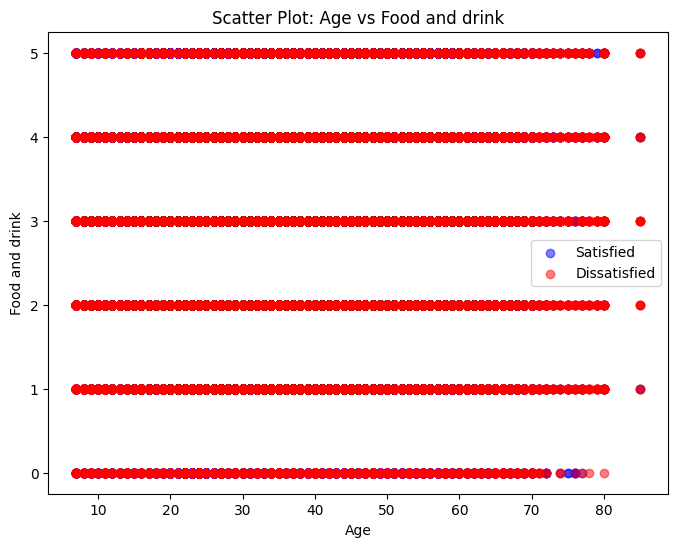

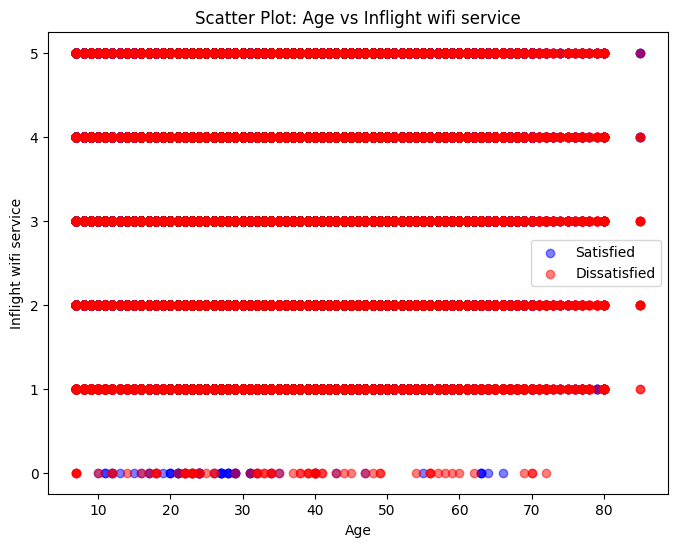

...

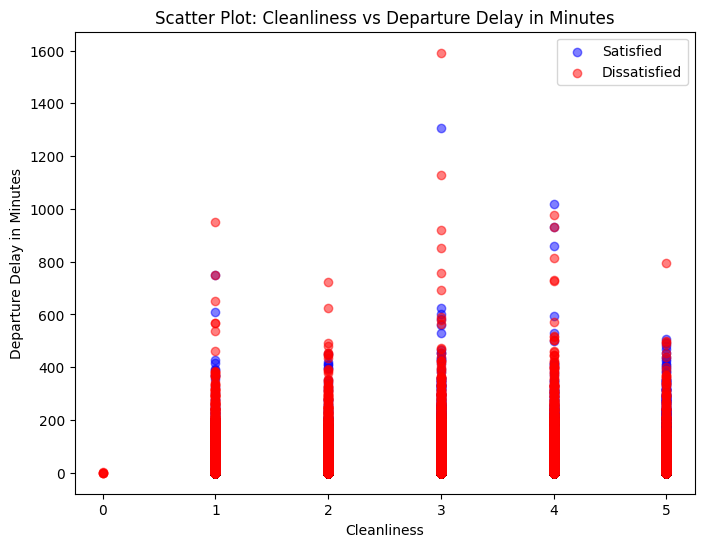

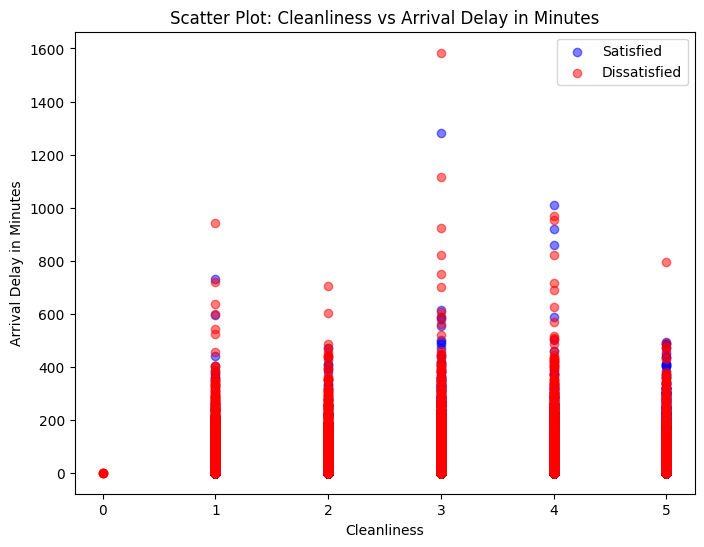

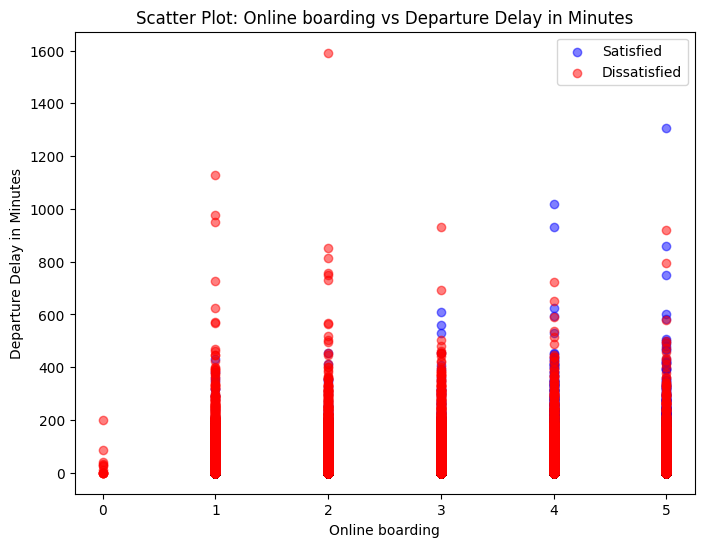

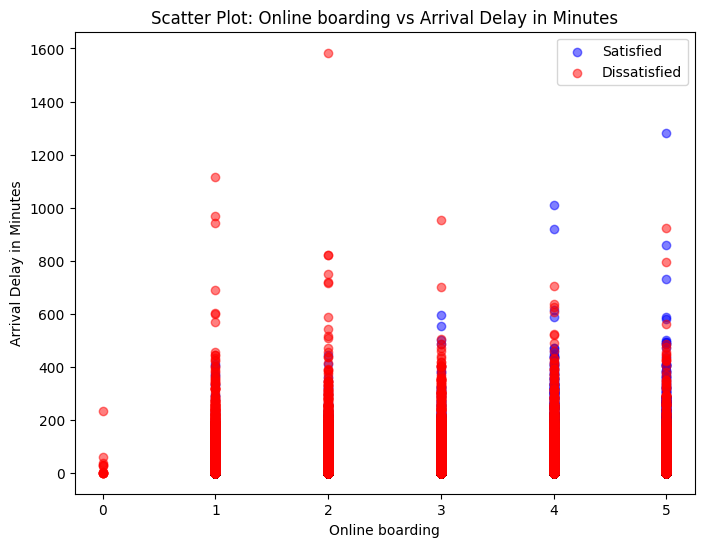

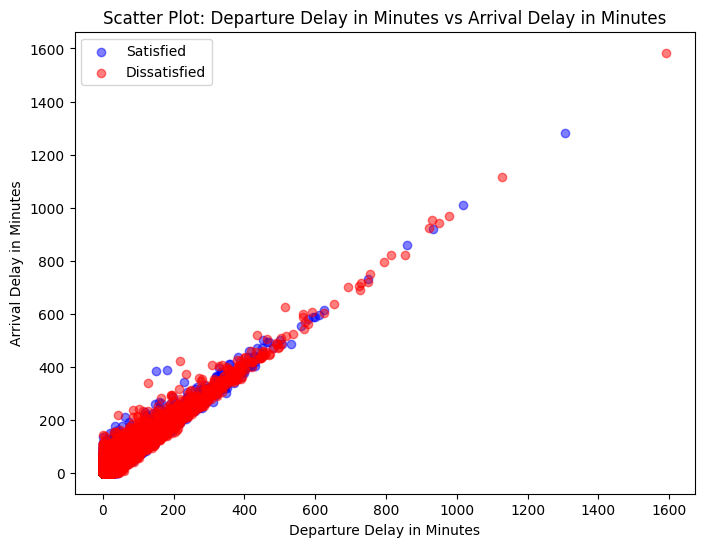

In [ ]:
# Создадим диаграммы рассеяния для всех возможных пар численных признаков
for i in range(len(numeric_features)):
    for j in range(i + 1, len(numeric_features)):
        feature1 = numeric_features[i]
        feature2 = numeric_features[j]

        plt.figure(figsize=(8, 6))

        # Разделим данные на довольных и недовольных клиентов
        satisfied = airline_df[airline_df['satisfaction'] == 'satisfied']
        dissatisfied = airline_df[airline_df['satisfaction'] == 'dissatisfied']

        # Создадим диаграммы рассеяния для довольных и недовольных клиентов
        plt.scatter(satisfied[feature1], satisfied[feature2], c='b', alpha=0.5, label='Satisfied')
        plt.scatter(dissatisfied[feature1], dissatisfied[feature2], c='r', alpha=0.5, label='Dissatisfied')

        plt.title(f'Scatter Plot: {feature1} vs {feature2}')
        plt.xlabel(feature1)
        plt.ylabel(feature2)
        plt.legend()
        plt.show()

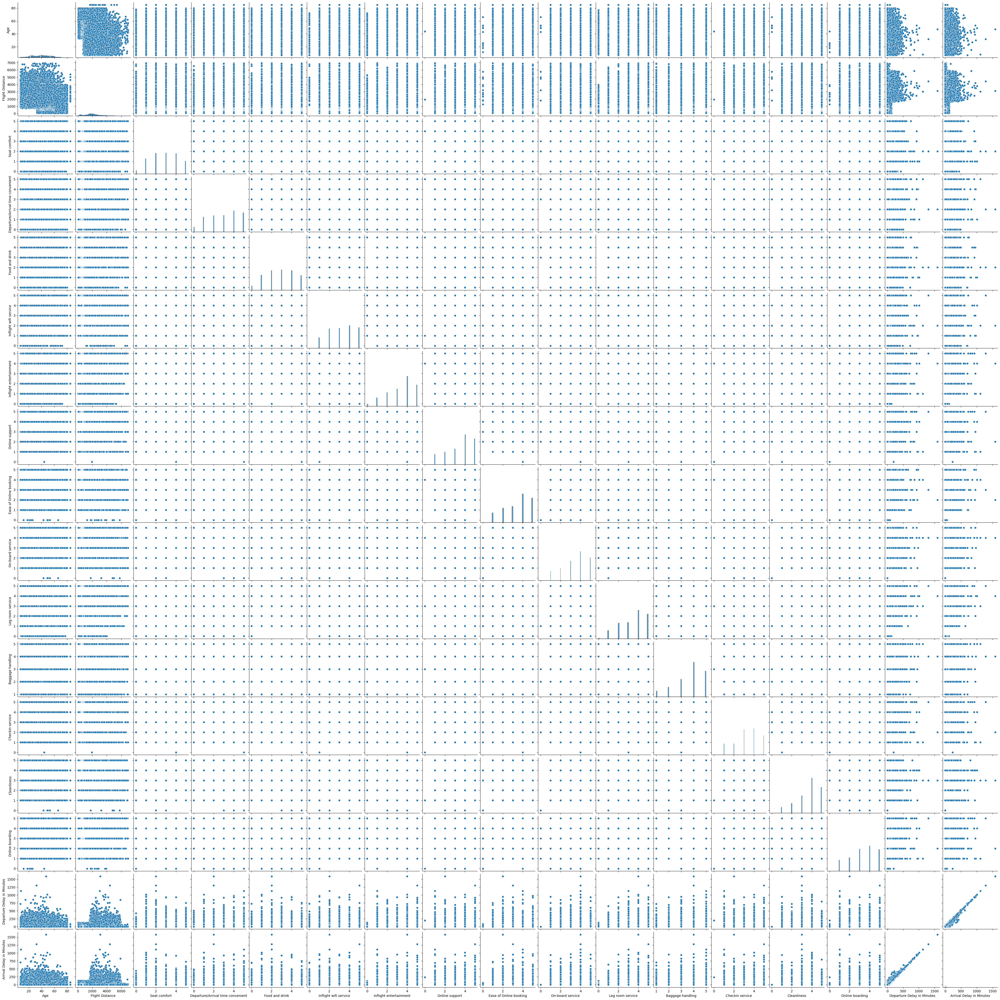

In [ ]:
sns.pairplot(airline_df[numeric_features])
plt.show()

### Параллельные координаты для визуализации числовых признаков в зависимости от категориального признака "satisfaction".
Этот вид графика позволяет сравнивать значения числовых признаков для разных категорий с помощью параллельных линий на горизонтальных осях.

In [ ]:
numeric_features.append('satisfaction')

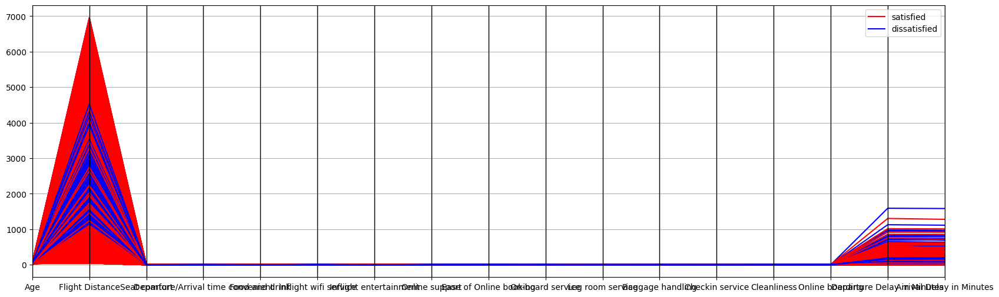

In [ ]:
plt.figure(figsize = (20, 6))
parallel_coordinates(airline_df[numeric_features], 'satisfaction', color=('red', 'blue'))
plt.show()

In [ ]:
numeric_features.remove('satisfaction')

### Столбчатые диаграммы (bar charts):
Подходят для визуализации категориальных переменных, таких как тип класса обслуживания, тип питания и т.д.

In [ ]:
# Выберем категориальные признаки для анализа
categorical_features = [
    'Customer Type', 'Type of Travel', 'Class',
    'Gate location', 'Inflight wifi service',
    'Inflight entertainment', 'Online support',
    'Ease of Online booking', 'On-board service',
    'Leg room service', 'Baggage handling', 'Checkin service',
    'Cleanliness', 'Online boarding'
]

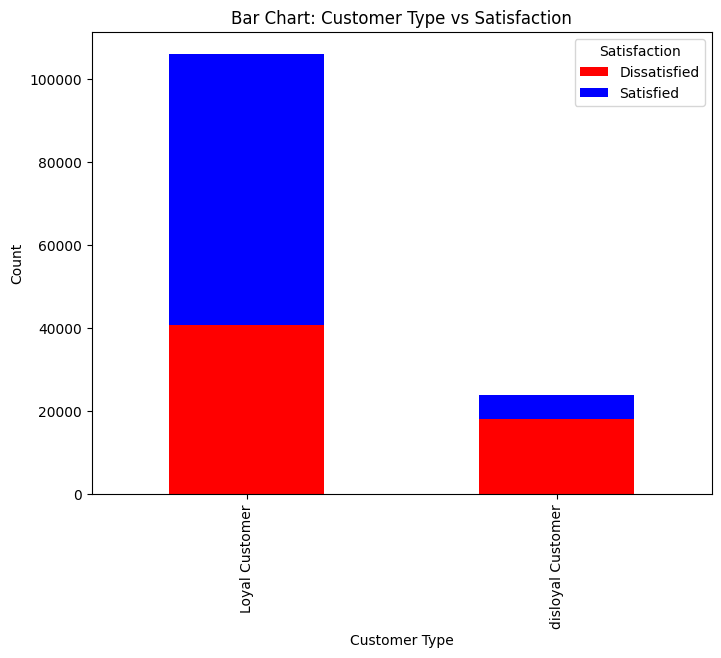

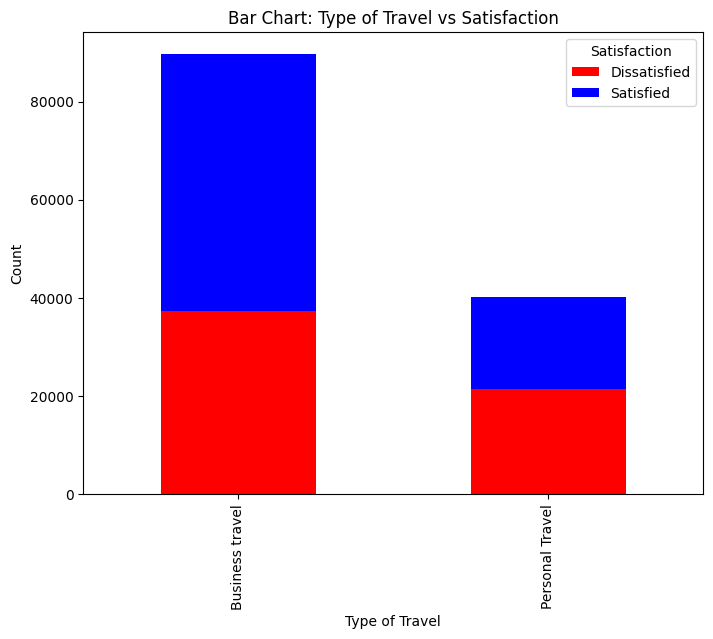

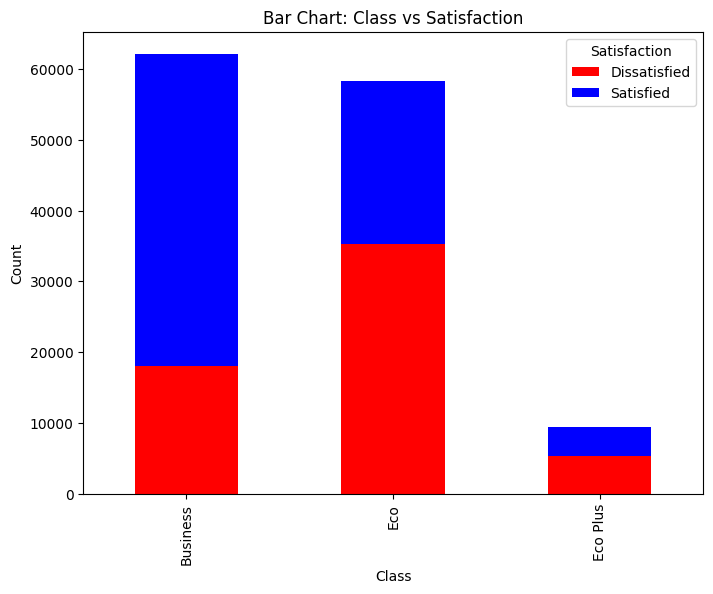

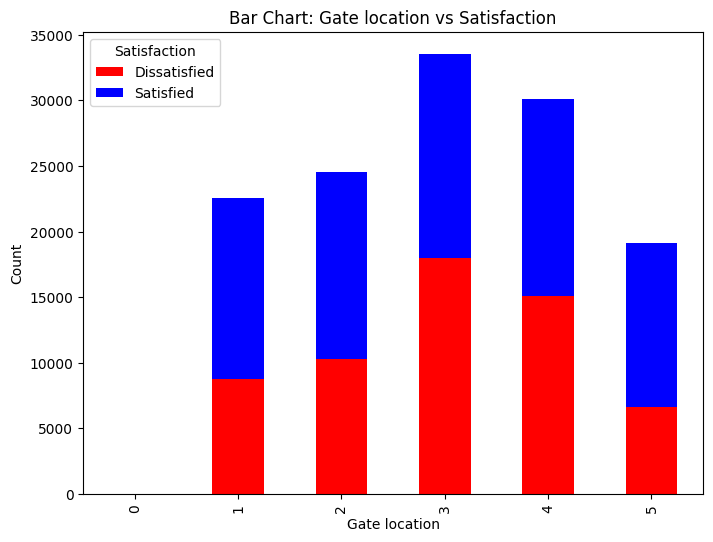

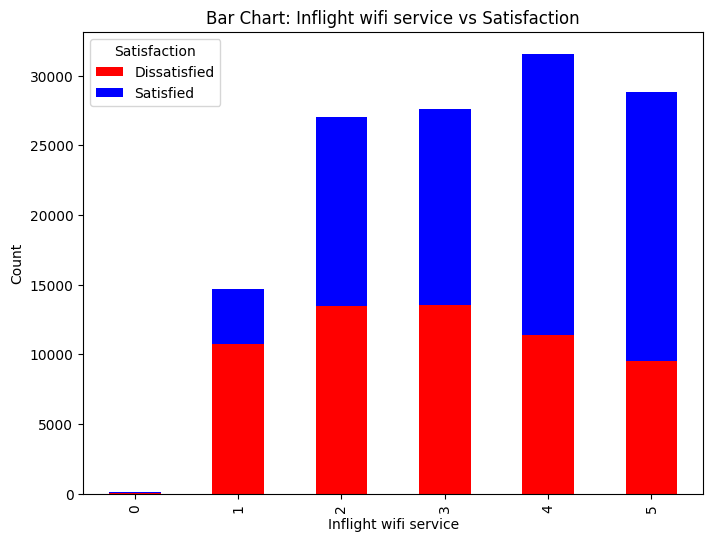

...

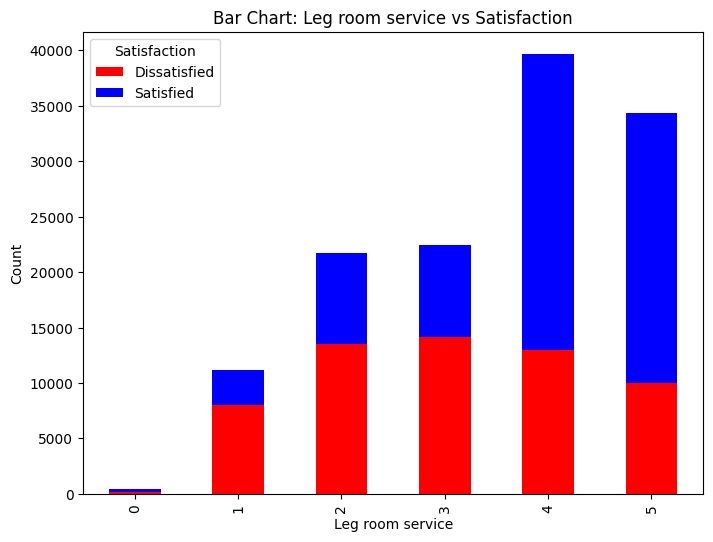

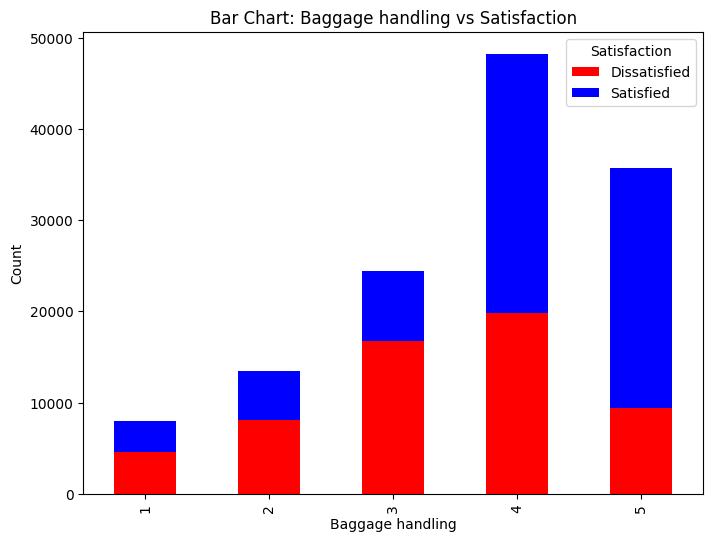

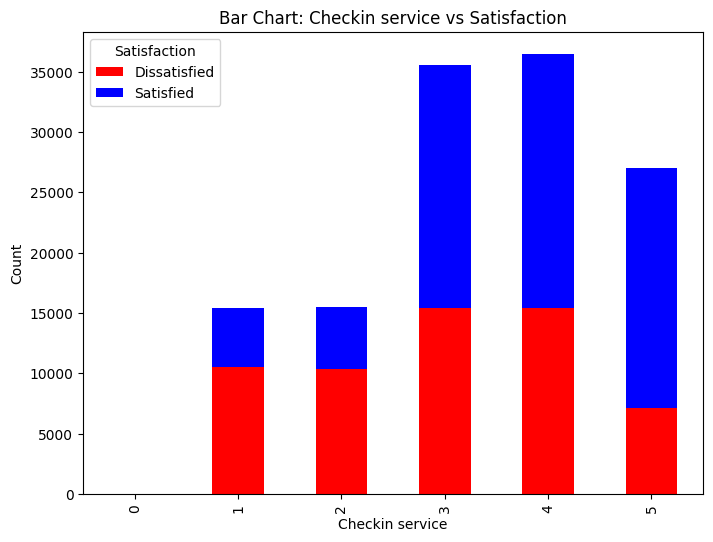

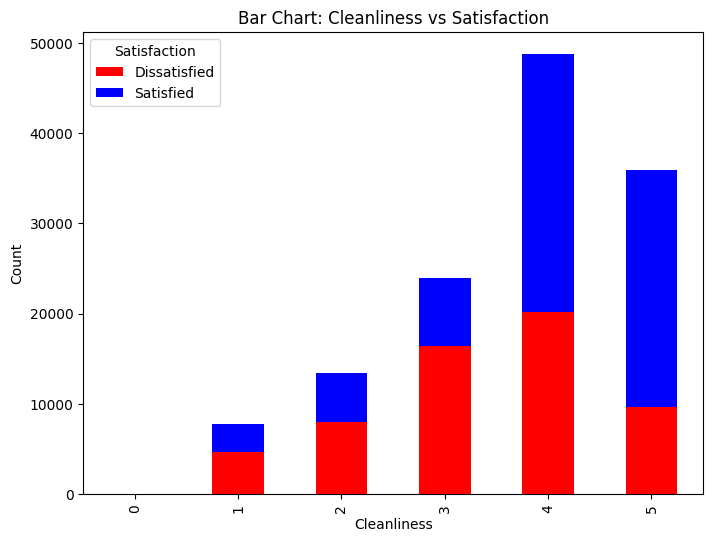

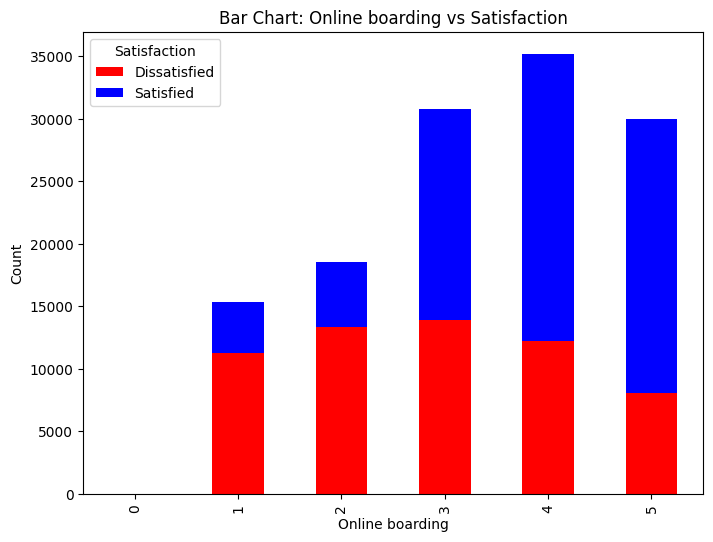

In [ ]:
# Создадим столбчатые диаграммы для каждого категориального признака
for feature in categorical_features:
    plt.figure(figsize=(8, 6))

    # Группируем данные по категории удовлетворенности и подсчитываем их количество
    satisfaction_counts = airline_df.groupby([feature, 'satisfaction']).size().unstack()

    # Создаем столбчатую диаграмму для каждой категории удовлетворенности
    satisfaction_counts.plot(kind='bar', stacked=True, color=['red', 'blue'], ax=plt.gca())

    plt.title(f'Bar Chart: {feature} vs Satisfaction')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.legend(title='Satisfaction', labels=['Dissatisfied', 'Satisfied'])
    plt.show()

### Круговые диаграммы (pie charts):
Подходят для визуализации категориальных переменных и долей в общем объеме.

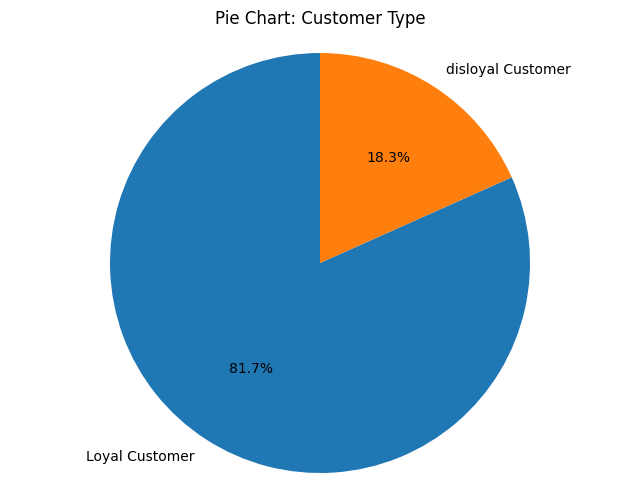

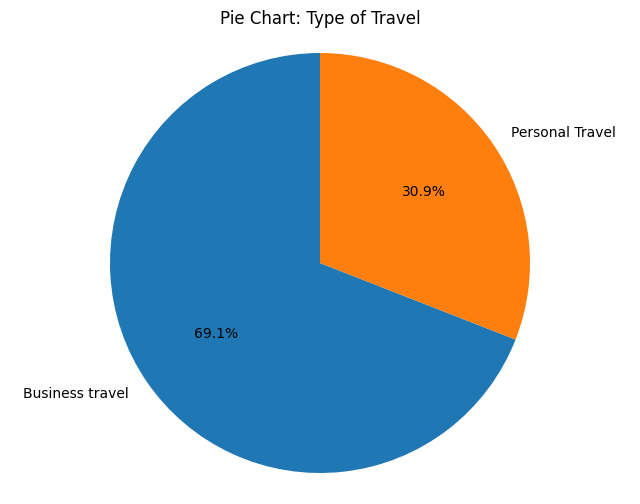

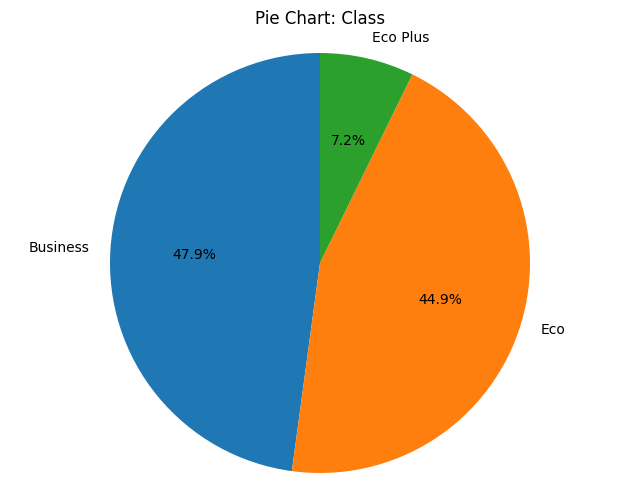

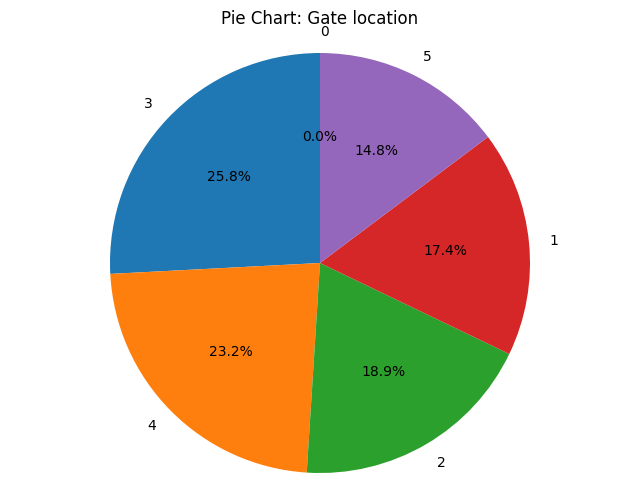

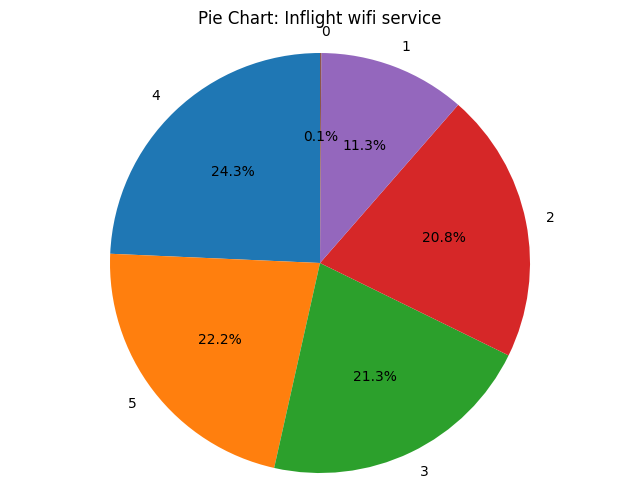

...

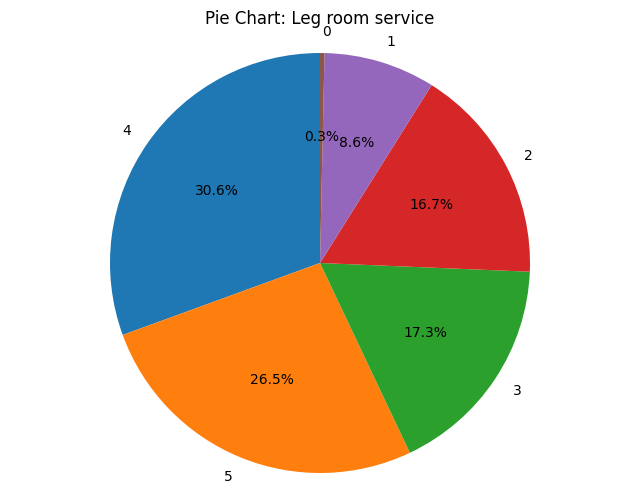

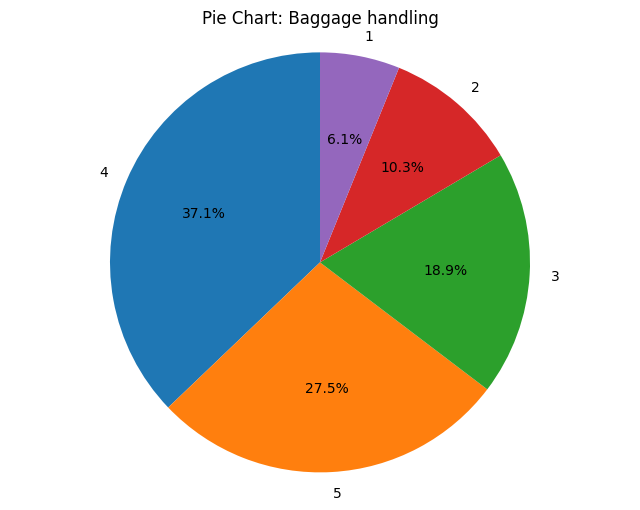

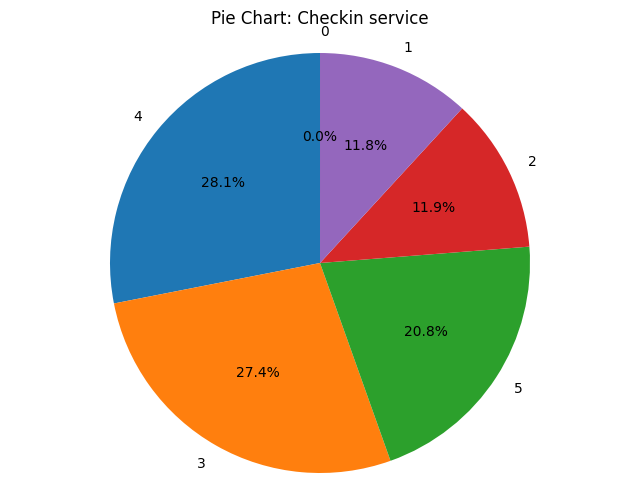

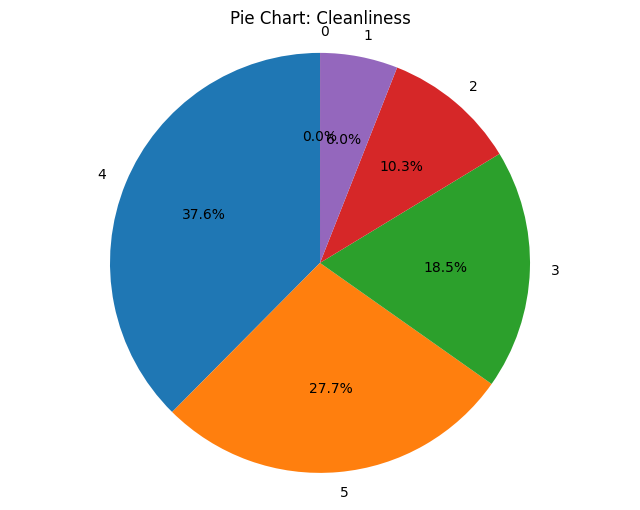

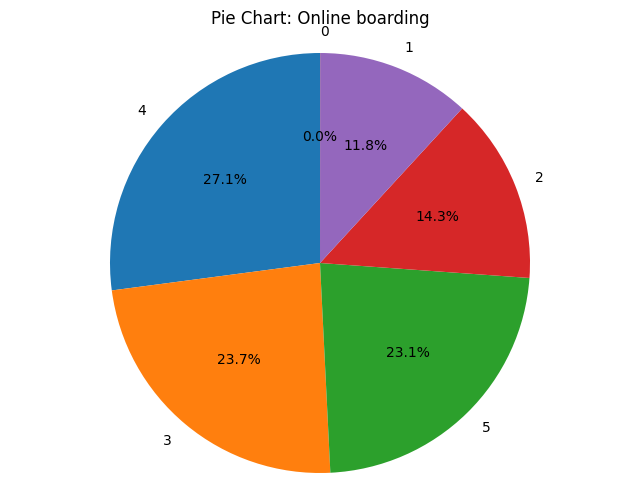

In [ ]:
# Создадим круговые диаграммы для каждого категориального признака
for feature in categorical_features:
    plt.figure(figsize=(8, 6))

    # Группируем данные по категории удовлетворенности и подсчитываем их количество
    satisfaction_counts = airline_df[feature].value_counts()

    # Создаем круговую диаграмму
    plt.pie(satisfaction_counts, labels=satisfaction_counts.index, autopct='%1.1f%%', startangle=90)

    plt.title(f'Pie Chart: {feature}')
    plt.axis('equal')  # Делаем диаграмму круглой
    plt.show()

### Корреляционная матрица (correlation matrix):
Позволяет оценить корреляции между численными признаками.

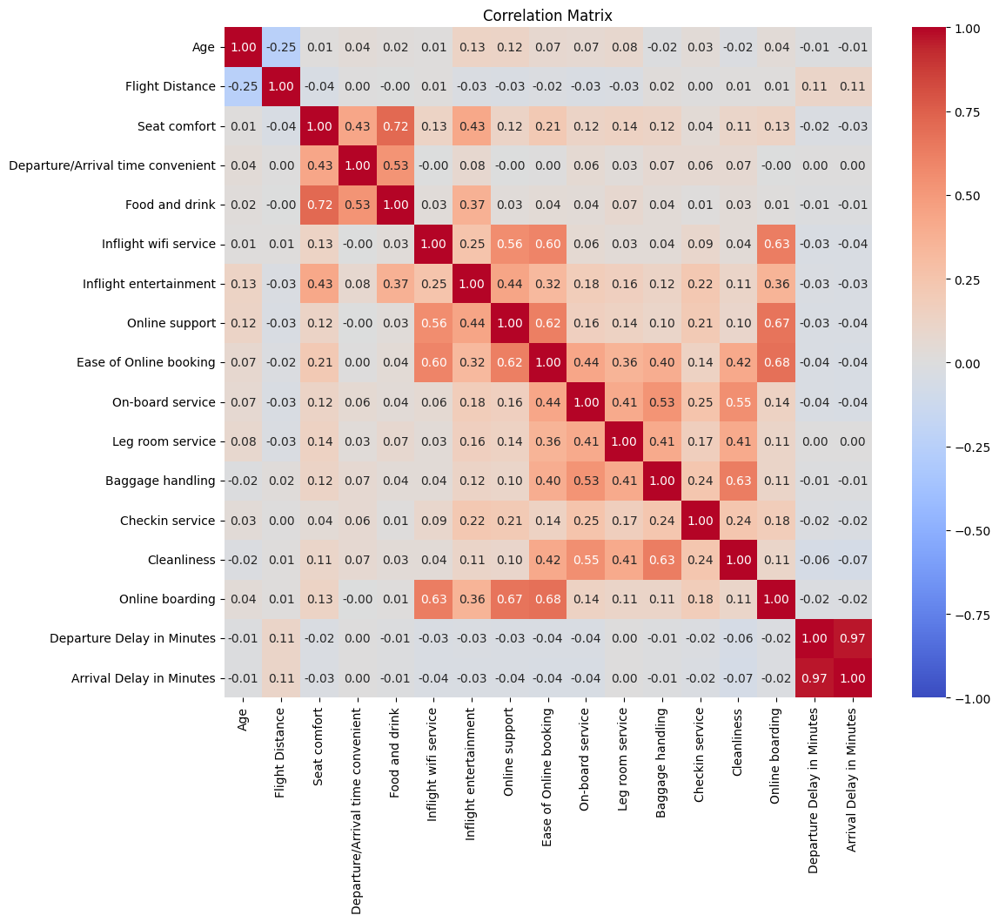

In [ ]:
# Создадим корреляционную матрицу
correlation_matrix = airline_df[numeric_features].corr()

# Создадим тепловую карту для корреляционной матрицы
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, center=0)
plt.title('Correlation Matrix')
plt.show()

### Графики зависимости времени (time series plots):
Если у нас есть временные данные, мы можем построить графики, чтобы выявить сезонные тренды.

In [ ]:
# Признаки связанные с временем
time_features = ['Departure Delay in Minutes', 'Arrival Delay in Minutes']

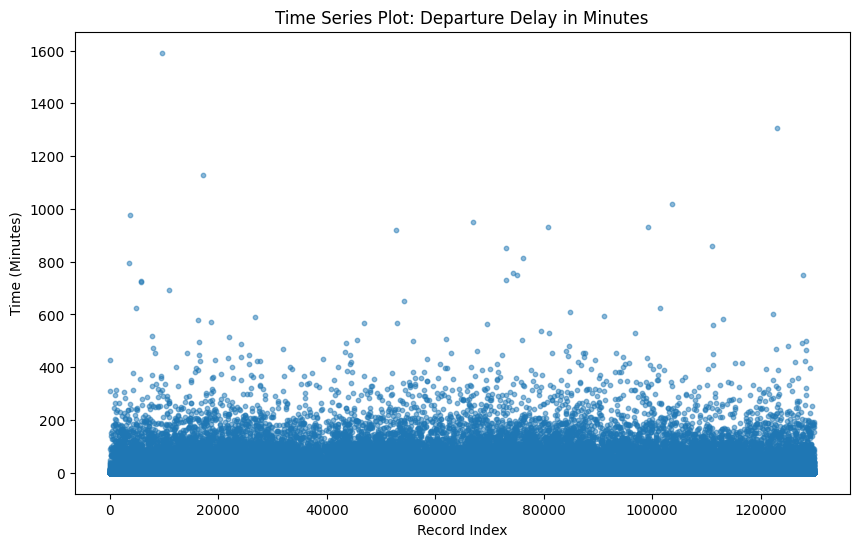

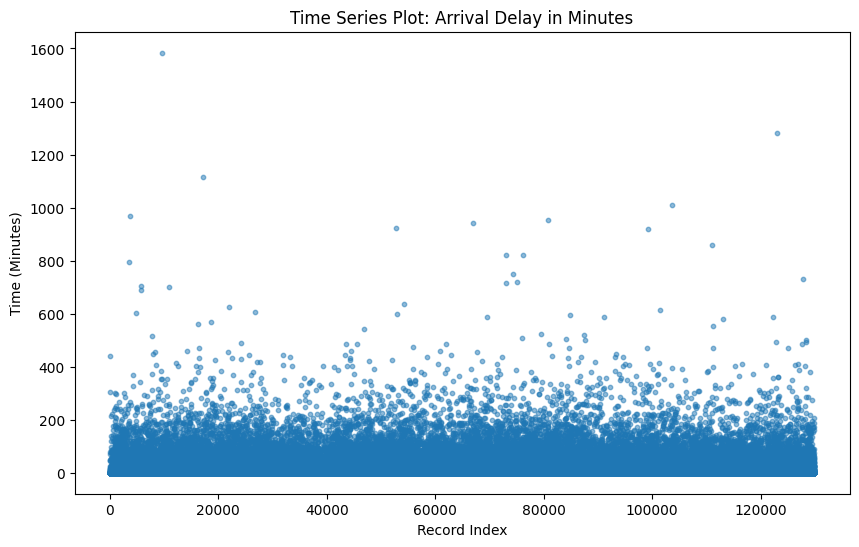

In [ ]:
# Создадим графики зависимости времени для каждого признака
for feature in time_features:
    plt.figure(figsize=(10, 6))

    # Используем scatter plot для отображения времени задержки в зависимости от индекса записи
    plt.scatter(airline_df.index, airline_df[feature], s=10, alpha=0.5)

    plt.title(f'Time Series Plot: {feature}')
    plt.xlabel('Record Index')
    plt.ylabel('Time (Minutes)')
    plt.show()

### Что мы можем выяснить с помощью этих графиков:

*   Распределение уровня удовлетворенности клиентов.
*   Какие факторы могут влиять на удовлетворенность, например, класс обслуживания, тип питания, время полета и т.д.
*   Корреляции между различными признаками.


## Data Preprocessing

Consider all the dimensionality reduction technique types covered in the course until now. Explain how you use them, analyze their applicability.

Do not forget other preprocessing steps, like feature selection, feature engineering etc. (25% – Preproc)

Explain each step. (5% – Explain)

### Обработка пропущенных значений:
Проверим, есть ли пропущенные значения в данных, и решим, как их обработать (заполнить, удалить и т.д.).

In [ ]:
# Определите столбцы, в которых есть пропущенные значения
columns_with_missing_values = airline_df.columns[airline_df.isnull().any()]

# Вариант 1: Удаление записей с пропущенными значениями
data_dropped = airline_df.dropna()

# Вариант 2: Заполнение пропущенных значений медианными значениями
data_filled_median = airline_df[columns_with_missing_values].fillna(airline_df.median())

# Вариант 3: Заполнение пропущенных значений средними значениями
data_filled_mean = airline_df[columns_with_missing_values].fillna(airline_df.mean())

# Вариант 4: Заполнение пропущенных значений значением "Unknown" (если столбец содержит текстовые данные)
data_filled_unknown = airline_df[columns_with_missing_values].fillna("Unknown")

# Выведем информацию о данных после обработки
print("Исходное количество записей:", len(airline_df))
print("Количество записей после удаления:", len(data_dropped))

Исходное количество записей: 129880
Количество записей после удаления: 129487


### Кодирование категориальных переменных:
Категориальные переменные (например, тип класса обслуживания) нужно закодировать в числовой формат (One-Hot Encoding или Label Encoding).

One-Hot Encoding

In [ ]:
categorical_features = ['Customer Type', 'Type of Travel', 'Class', ]

In [ ]:
# Вариант 1: One-Hot Encoding с использованием функции get_dummies
data_encoded = pd.get_dummies(data_dropped, columns=categorical_features)

# Выведем информацию о данных после кодирования
print("Исходное количество признаков:", len(data_dropped.columns))
print("Количество признаков после One-Hot Encoding:", len(data_encoded.columns))

Исходное количество признаков: 22
Количество признаков после One-Hot Encoding: 26


Label Encoding

In [ ]:
# Handling Categorical Features
category_mapping = {
    "satisfied": 1,
    "dissatisfied": 0
}

data_encoded['satisfaction'] = data_encoded['satisfaction'].map(category_mapping)

### Масштабирование признаков:
Масштабируем численные признаки, чтобы они имели одинаковую значимость для модели.

In [ ]:
# Выведем информацию о данных после масштабирования
print("Минимальные значения до масштабирования:")
print(data_encoded[numeric_features].min())
print("\nМаксимальные значения до масштабирования:")
print(data_encoded[numeric_features].max())

# Min-Max Scaling с использованием MinMaxScaler из scikit-learn
scaler = MinMaxScaler()
data_scaled = data_encoded.copy()
data_scaled[numeric_features] = scaler.fit_transform(data_encoded[numeric_features])

# Выведем информацию о данных после масштабирования
print("Минимальные значения после масштабирования:")
print(data_scaled[numeric_features].min())
print("\nМаксимальные значения после масштабирования:")
print(data_scaled[numeric_features].max())

Минимальные значения до масштабирования:
Age                                   7.0
Flight Distance                      50.0
Seat comfort                          0.0
Departure/Arrival time convenient     0.0
Food and drink                        0.0
Inflight wifi service                 0.0
Inflight entertainment                0.0
Online support                        0.0
Ease of Online booking                0.0
On-board service                      0.0
Leg room service                      0.0
Baggage handling                      1.0
Checkin service                       0.0
Cleanliness                           0.0
Online boarding                       0.0
Departure Delay in Minutes            0.0
Arrival Delay in Minutes              0.0
dtype: float64

Максимальные значения до масштабирования:
Age                                    85.0
Flight Distance                      6951.0
Seat comfort                            5.0
Departure/Arrival time convenient       5.0
Food and dr

### Функции извлечения признаков (feature engineering):
Мы можем создать новые признаки на основе существующих, если это будет полезно.

In [ ]:
# Выведем информацию о данных до извлечения признаков
print("Исходное количество признаков:", len(data_scaled.columns))

# Пример 1: Создание нового признака "Total Delay" путем сложения задержки отправления и задержки прибытия
data_scaled['Total Delay'] = data_scaled['Departure Delay in Minutes'] + data_scaled['Arrival Delay in Minutes']

# Пример 2: Создание нового бинарного признака "Long Flight" для дальних перелетов
data_scaled['Long Flight'] = (data_scaled['Flight Distance'] > data_scaled['Flight Distance'].median()).astype(int)

# Выведем информацию о данных после извлечения признаков
print("Количество признаков после извлечения:", len(data_scaled.columns))

Исходное количество признаков: 26
Количество признаков после извлечения: 28


Выделяем фичи и таргет

In [ ]:
# Определение матрицы признаков X и целевой переменной y
X = data_scaled.drop(columns=['satisfaction'])  # Удаление столбца 'satisfaction' из данных
y = data_scaled['satisfaction']  # Выделение целевой переменной 'satisfaction'

### Уменьшение размерности (dimensionality reduction):
Рассмотрим методы уменьшения размерности, такие как PCA, NMF, CCA, LDA, для сокращения числа признаков.

### PCA

In [ ]:
# Создадим объект PCA с заданным количеством компонент
n_components = 10  # Укажите желаемое количество компонент
pca = PCA(n_components=n_components)

# Произведем уменьшение размерности
data_pca = pca.fit_transform(X)

# Создадим новый DataFrame с уменьшенной размерностью
X_pca = pd.DataFrame(data_pca, columns=[f'PC{i+1}' for i in range(n_components)])

# Выведем информацию о данных после уменьшения размерности
print("Исходное количество признаков:", len(X.columns))
print("Количество признаков после уменьшения размерности:", len(X_pca.columns))

Исходное количество признаков: 27
Количество признаков после уменьшения размерности: 10


### NMF

In [ ]:
# Инициализация и обучение модели NMF
nmf = NMF(n_components=n_components)
nmf.fit(X)

# Преобразование данных с использованием NMF и создание нового DataFrame
X_nmf = pd.DataFrame(nmf.transform(X))

# Выведем информацию о данных после уменьшения размерности
print("Исходное количество признаков:", len(X.columns))
print("Количество признаков после уменьшения размерности:", len(X_nmf.columns))

Исходное количество признаков: 27
Количество признаков после уменьшения размерности: 10


### CCA

In [ ]:
# Выбор определенных признаков для наборов данных X_obj и X_subj
X_obj=X[['Customer Type_disloyal Customer', 'Customer Type_Loyal Customer', 'Age', 'Type of Travel_Personal Travel',
       'Type of Travel_Business travel', 'Class_Business', 'Class_Eco', 'Class_Eco Plus', 'Flight Distance']]
X_subj=X[['Seat comfort', 'Departure/Arrival time convenient', 'Food and drink',
       'Gate location', 'Inflight wifi service', 'Inflight entertainment',
       'Online support', 'Ease of Online booking', 'On-board service',
       'Leg room service','Baggage handling','Checkin service',
       'Cleanliness', 'Online boarding']]

In [ ]:
# Инициализация модели канонической корреляционной анализа (CCA)
cca = CCA()

# Применение CCA для совместного преобразования данных X_obj и X_subj
X_obj, X_subj = cca.fit_transform(X_obj, X_subj)

### LDA

In [ ]:
# Инициализация модели линейного дискриминантного анализа (LDA) с 1 компонентой
lda = LDA(n_components=1)

# Применение LDA к данным X и y
X_lda = lda.fit_transform(X, y)

# Вывод информации об объясненной дисперсии
print('explained variance ratio: %s' % str(lda.explained_variance_ratio_))

explained variance ratio: [1.]


## Prediction

Consider various classification models known to you, try to achieve maximum quality at the evaluation setting described above. (25% – Model quality)

Explain the model choice you've made. (5% – Explain)

In [ ]:
# Создание объекта StratifiedKFold
n_splits = 10
random_state = 42
skf = StratifiedKFold(n_splits=n_splits, random_state=random_state, shuffle=True)

In [ ]:
def train_model(X_train, y_train, model):
    # Создание и обучение модели
    model.fit(X_train, y_train)

    # Предсказывание на тестовом наборе
    y_pred = model.predict(X_test)

    # Вычисление balanced_accuracy_score
    return balanced_accuracy_score(y_test, y_pred)

In [ ]:
def analyze_model(model, X_train, X_test, y_train, y_test):
    # Обучение модели
    balanced_acc = train_model(X_train, y_train, model)
    print(f'Balanced Accuracy: {balanced_acc:.4f}')

In [ ]:
# Создание списка, содержащего различные наборы данных после разных методов снижения размерности
list_of_X = [
    np.array(X_pca),  # Данные после PCA
    np.array(X_nmf),  # Данные после NMF
    np.array(X_obj),  # Данные после метода объектов
    np.array(X_subj),  # Данные после метода субъектов
    np.array(X_lda)  # Данные после LDA
]

In [ ]:
# Создание словаря моделей с указанием названий и инициализацией моделей
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),  # Логистическая регрессия
    'Random Forest': RandomForestClassifier(random_state=random_state),  # Случайный лес
    'SVM': SVC(random_state=random_state),  # Метод опорных векторов (SVM)
    'Gradient Boosting': GradientBoostingClassifier(random_state=random_state)  # Градиентный бустинг
}

In [ ]:
# Сброс индексов данных X и y, удаляя существующий столбец с индексами
X.reset_index(inplace=True, drop=True)
y.reset_index(inplace=True, drop=True)

In [ ]:
# Перебор моделей и их названий из словаря models
for model_name, model in models.items():
    print(f"Model: {model_name}")  # Вывод названия текущей модели

    # Перебор наборов данных после разных методов снижения размерности
    for X in list_of_X:

        # Использование StratifiedKFold для разделения данных на обучающий и тестовый наборы
        for train_index, test_index in skf.split(X, y):
            X_train, X_test = X[train_index], X[test_index]  # Разделение данных на обучающий и тестовый наборы
            y_train, y_test = y[train_index], y[test_index]

            print(f"Using feature reduction method with shape {X.shape}")  # Вывод информации о текущем методе снижения размерности

            # Вызов функции analyze_model для обучения и оценки модели
            analyze_model(model, X_train, X_test, y_train, y_test)


Model: Logistic Regression
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7921
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7999
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7991
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.8029
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7982
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7939
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.8044
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.8020
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7988
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7998
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7672
Using feature reduction method with shape (129487, 10)
Balanced Accuracy: 0.7755
U

## Analysis

Analyze the model parameters by some method, try to explain how the service should be changed to increase the customer satisfaction. Explain it in the means of original features. (10% – Explain)

В данной секции анализа мы проведем оценку результатов модели классификации, определенной на этапе Model prediction. Мы будем рассматривать результаты и важность признаков, а также формулировать рекомендации для улучшения уровня удовлетворенности клиентов.

### Оценка моделей

Мы использовали несколько моделей классификации для прогнозирования уровня удовлетворенности клиентов на основе предоставленных данных о полетах. Каждая из моделей (логистическая регрессия, случайный лес, метод опорных векторов и градиентный бустинг) была обучена с использованием метода StratifiedKFold с 10 разбиениями и random_state = 42.

Для оценки качества моделей мы использовали метрику balanced_accuracy_score, которая учитывает баланс классов и является хорошей метрикой для задач с несбалансированными классами.

В результате оценки моделей, мы получили средние значения balanced_accuracy_score для каждой из них. Эти значения позволяют нам сравнить производительность различных моделей и выбрать наилучшую для дальнейшего анализа.

### Важность признаков

Одним из ключевых аспектов анализа модели является оценка важности признаков. Мы использовали различные методы, предоставленные каждой моделью, чтобы определить, какие признаки оказывают наибольшее влияние на предсказания модели.

Например, для случайного леса и градиентного бустинга, мы получили важность признаков, которая позволяет нам понять, какие аспекты (например, уровень комфорта сиденья или время задержки отправления) сильнее всего влияют на уровень удовлетворенности клиентов. Эта информация может быть ценной для бизнеса и маркетинга.

### Рекомендации

На основе результатов анализа модели и важности признаков мы можем сформулировать следующие рекомендации для компании:

1. **Улучшение условий на борту:** Наши модели показали, что уровень комфорта сиденья и качество обслуживания на борту сильно влияют на уровень удовлетворенности клиентов. Рекомендуется обратить внимание на улучшение условий на борту и обучение персонала.

2. **Управление временем задержки:** Время задержки отправления и прибытия также оказывает влияние на удовлетворенность клиентов. Компания может принимать меры для управления и сокращения времени задержки.

3. **Развитие онлайн-сервисов:** Качество онлайн-сервисов, таких как бронирование билетов и поддержка онлайн, также важно для клиентов. Рекомендуется развивать и совершенствовать эти сервисы.

4. **Контроль качества:** Поддержание чистоты и порядка на борту, а также багажное обслуживание и процесс регистрации - важные аспекты, которые следует контролировать и улучшать.

5. **Персонализированный подход:** На основе анализа данных и моделей, компания может разработать персонализированные подходы к клиентам, учитывая их предпочтения и потребности.

6. **Мониторинг и обратная связь:** Постоянный мониторинг и обратная связь от клиентов могут помочь компании адаптировать свои услуги и улучшить уровень удовлетворенности.

7. **Эксперименты и оценка:** Рекомендуется проводить эксперименты на основе выдвинутых рекомендаций и оценивать их влияние на удовлетворенность клиентов. Метрики и данные о клиентах могут помочь измерить успех внесенных изменений.
